In [5]:
from google.colab import files
uploaded = files.upload()

Saving NYC Accidents 2020.csv to NYC Accidents 2020.csv


In [6]:
!pip install geopandas folium


In [29]:
import pandas as pd
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
import folium
sns.set(style='whitegrid')

In [30]:
# Load CSV
df = pd.read_csv("NYC Accidents 2020.csv")

# Standardize column names
df.columns = df.columns.str.strip().str.upper().str.replace(' ', '_')

# Preview
print(df.columns.tolist())



['CRASH_DATE', 'CRASH_TIME', 'BOROUGH', 'ZIP_CODE', 'LATITUDE', 'LONGITUDE', 'LOCATION', 'ON_STREET_NAME', 'CROSS_STREET_NAME', 'OFF_STREET_NAME', 'NUMBER_OF_PERSONS_INJURED', 'NUMBER_OF_PERSONS_KILLED', 'NUMBER_OF_PEDESTRIANS_INJURED', 'NUMBER_OF_PEDESTRIANS_KILLED', 'NUMBER_OF_CYCLIST_INJURED', 'NUMBER_OF_CYCLIST_KILLED', 'NUMBER_OF_MOTORIST_INJURED', 'NUMBER_OF_MOTORIST_KILLED', 'CONTRIBUTING_FACTOR_VEHICLE_1', 'CONTRIBUTING_FACTOR_VEHICLE_2', 'CONTRIBUTING_FACTOR_VEHICLE_3', 'CONTRIBUTING_FACTOR_VEHICLE_4', 'CONTRIBUTING_FACTOR_VEHICLE_5', 'COLLISION_ID', 'VEHICLE_TYPE_CODE_1', 'VEHICLE_TYPE_CODE_2', 'VEHICLE_TYPE_CODE_3', 'VEHICLE_TYPE_CODE_4', 'VEHICLE_TYPE_CODE_5']


In [31]:
# See all column names
print(df.columns.tolist())


['CRASH_DATE', 'CRASH_TIME', 'BOROUGH', 'ZIP_CODE', 'LATITUDE', 'LONGITUDE', 'LOCATION', 'ON_STREET_NAME', 'CROSS_STREET_NAME', 'OFF_STREET_NAME', 'NUMBER_OF_PERSONS_INJURED', 'NUMBER_OF_PERSONS_KILLED', 'NUMBER_OF_PEDESTRIANS_INJURED', 'NUMBER_OF_PEDESTRIANS_KILLED', 'NUMBER_OF_CYCLIST_INJURED', 'NUMBER_OF_CYCLIST_KILLED', 'NUMBER_OF_MOTORIST_INJURED', 'NUMBER_OF_MOTORIST_KILLED', 'CONTRIBUTING_FACTOR_VEHICLE_1', 'CONTRIBUTING_FACTOR_VEHICLE_2', 'CONTRIBUTING_FACTOR_VEHICLE_3', 'CONTRIBUTING_FACTOR_VEHICLE_4', 'CONTRIBUTING_FACTOR_VEHICLE_5', 'COLLISION_ID', 'VEHICLE_TYPE_CODE_1', 'VEHICLE_TYPE_CODE_2', 'VEHICLE_TYPE_CODE_3', 'VEHICLE_TYPE_CODE_4', 'VEHICLE_TYPE_CODE_5']


In [32]:
# Standardize column names: strip spaces, replace with underscores, uppercase
df.columns = df.columns.str.strip().str.upper().str.replace(' ', '_')
print(df.columns.tolist())


['CRASH_DATE', 'CRASH_TIME', 'BOROUGH', 'ZIP_CODE', 'LATITUDE', 'LONGITUDE', 'LOCATION', 'ON_STREET_NAME', 'CROSS_STREET_NAME', 'OFF_STREET_NAME', 'NUMBER_OF_PERSONS_INJURED', 'NUMBER_OF_PERSONS_KILLED', 'NUMBER_OF_PEDESTRIANS_INJURED', 'NUMBER_OF_PEDESTRIANS_KILLED', 'NUMBER_OF_CYCLIST_INJURED', 'NUMBER_OF_CYCLIST_KILLED', 'NUMBER_OF_MOTORIST_INJURED', 'NUMBER_OF_MOTORIST_KILLED', 'CONTRIBUTING_FACTOR_VEHICLE_1', 'CONTRIBUTING_FACTOR_VEHICLE_2', 'CONTRIBUTING_FACTOR_VEHICLE_3', 'CONTRIBUTING_FACTOR_VEHICLE_4', 'CONTRIBUTING_FACTOR_VEHICLE_5', 'COLLISION_ID', 'VEHICLE_TYPE_CODE_1', 'VEHICLE_TYPE_CODE_2', 'VEHICLE_TYPE_CODE_3', 'VEHICLE_TYPE_CODE_4', 'VEHICLE_TYPE_CODE_5']


In [12]:
key_columns = [
    'CRASH_DATE', 'CRASH_TIME', 'BOROUGH',
    'LATITUDE', 'LONGITUDE',
    'NUMBER_OF_PERSONS_INJURED', 'NUMBER_OF_PERSONS_KILLED',
    'CONTRIBUTING_FACTOR_VEHICLE_1', 'VEHICLE_TYPE_CODE_1',
    'ON_STREET_NAME', 'CROSS_STREET_NAME'
]

df = df[key_columns]


In [33]:
# Fill missing values
df['BOROUGH'] = df['BOROUGH'].fillna('UNKNOWN')
df['CONTRIBUTING_FACTOR_VEHICLE_1'] = df['CONTRIBUTING_FACTOR_VEHICLE_1'].fillna('UNSPECIFIED').str.upper().str.strip()
df['VEHICLE_TYPE_CODE_1'] = df['VEHICLE_TYPE_CODE_1'].fillna('UNKNOWN').str.upper().str.strip()
df['ON_STREET_NAME'] = df['ON_STREET_NAME'].fillna('UNKNOWN')
df['CROSS_STREET_NAME'] = df['CROSS_STREET_NAME'].fillna('UNKNOWN')

# Clean coordinates
df['LATITUDE'] = df['LATITUDE'].astype(str).str.replace(r'[()]', '', regex=True)
df['LONGITUDE'] = df['LONGITUDE'].astype(str).str.replace(r'[()]', '', regex=True)

df['LATITUDE'] = pd.to_numeric(df['LATITUDE'], errors='coerce')
df['LONGITUDE'] = pd.to_numeric(df['LONGITUDE'], errors='coerce')

# Drop rows with invalid coordinates
df = df.dropna(subset=['LATITUDE', 'LONGITUDE'])




In [35]:
# Uppercase + strip spaces
df['CONTRIBUTING_FACTOR_VEHICLE_1'] = df['CONTRIBUTING_FACTOR_VEHICLE_1'].str.upper().str.strip()
df['VEHICLE_TYPE_CODE_1'] = df['VEHICLE_TYPE_CODE_1'].str.upper().str.strip()

# Optional: keep top 10 contributing factors, group rest as 'OTHER'
top_factors = df['CONTRIBUTING_FACTOR_VEHICLE_1'].value_counts().nlargest(10).index
df['CONTRIBUTING_FACTOR_VEHICLE_1'] = df['CONTRIBUTING_FACTOR_VEHICLE_1'].apply(
    lambda x: x if x in top_factors else 'OTHER'
)


In [17]:
# Safety metrics
injury_rate = df['NUMBER_OF_PERSONS_INJURED'].sum() / df.shape[0]
fatality_rate = (df['NUMBER_OF_PERSONS_KILLED'].sum() / df.shape[0]) * 1000
severe_crash_share = df[df['SEVERITY_SCORE'] > 0].shape[0] / df.shape[0]

print(f"Injury Rate per Crash: {injury_rate:.2f}")
print(f"Fatality Rate per 1,000 Crashes: {fatality_rate:.2f}")
print(f"Severe Crash Share: {severe_crash_share:.2%}")


Injury Rate per Crash: 0.36
Fatality Rate per 1,000 Crashes: 1.86
Severe Crash Share: 27.29%


Borough Risk Index (Severity per Crash):
 BOROUGH
STATEN ISLAND    0.450179
UNKNOWN          0.432111
BROOKLYN         0.363163
BRONX            0.346714
QUEENS           0.335189
MANHATTAN        0.300535
dtype: float64


/tmp/ipython-input-3084269229.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=borough_risk_index.index, y=borough_risk_index.values, palette='Reds_r')


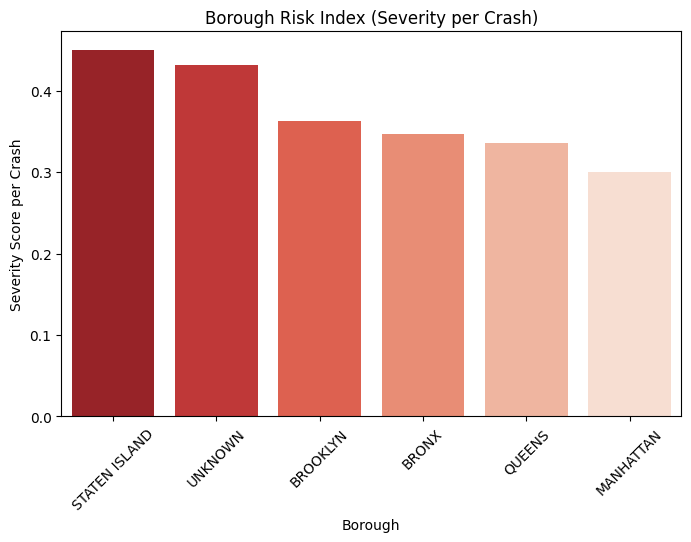

In [18]:
# Aggregate severity score by borough
borough_severity = df.groupby('BOROUGH')['SEVERITY_SCORE'].sum().sort_values(ascending=False)
borough_crashes = df['BOROUGH'].value_counts()

# Severity-weighted risk index
borough_risk_index = (borough_severity / borough_crashes).sort_values(ascending=False)
print("Borough Risk Index (Severity per Crash):\n", borough_risk_index)

# Visualization
plt.figure(figsize=(8,5))
sns.barplot(x=borough_risk_index.index, y=borough_risk_index.values, palette='Reds_r')
plt.title('Borough Risk Index (Severity per Crash)')
plt.ylabel('Severity Score per Crash')
plt.xlabel('Borough')
plt.xticks(rotation=45)
plt.show()


/tmp/ipython-input-4176622495.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_factors.values, y=top_factors.index, palette='Oranges_r')


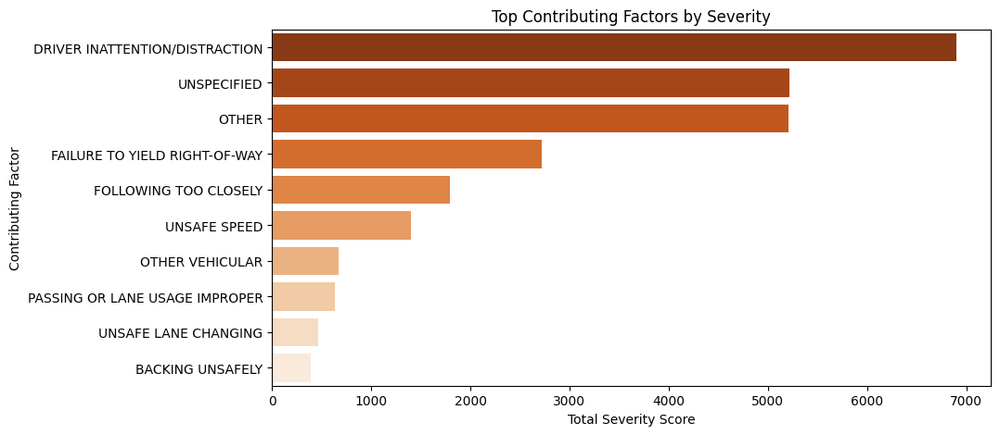

In [19]:
# Group by contributing factor, sum severity
factor_severity = df.groupby('CONTRIBUTING_FACTOR_VEHICLE_1')['SEVERITY_SCORE'].sum().sort_values(ascending=False)
top_factors = factor_severity.head(10)

# Visualization
plt.figure(figsize=(10,5))
sns.barplot(x=top_factors.values, y=top_factors.index, palette='Oranges_r')
plt.title('Top Contributing Factors by Severity')
plt.xlabel('Total Severity Score')
plt.ylabel('Contributing Factor')
plt.show()


/tmp/ipython-input-2660054296.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=vehicle_severity.values, y=vehicle_severity.index, palette='Blues_r')


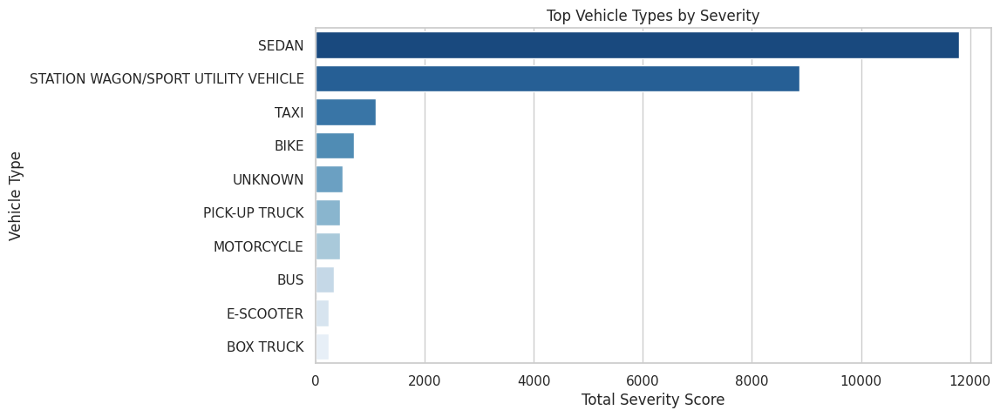

In [38]:
# Aggregate severity scores by vehicle type
vehicle_severity = df.groupby('VEHICLE_TYPE_CODE_1')['SEVERITY_SCORE'].sum().sort_values(ascending=False).head(10)


# Focus on top 10 vehicle types associated with severe crashes
top_vehicles = vehicle_severity.head(10)

# Visualization: Top 10 vehicle types by total severity
plt.figure(figsize=(10,5))
sns.barplot(x=vehicle_severity.values, y=vehicle_severity.index, palette='Blues_r')
plt.title('Top Vehicle Types by Severity')
plt.xlabel('Total Severity Score')
plt.ylabel('Vehicle Type')
plt.show()


/tmp/ipython-input-2282657535.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=street_severity.values, y=street_severity.index, palette='Reds_r')


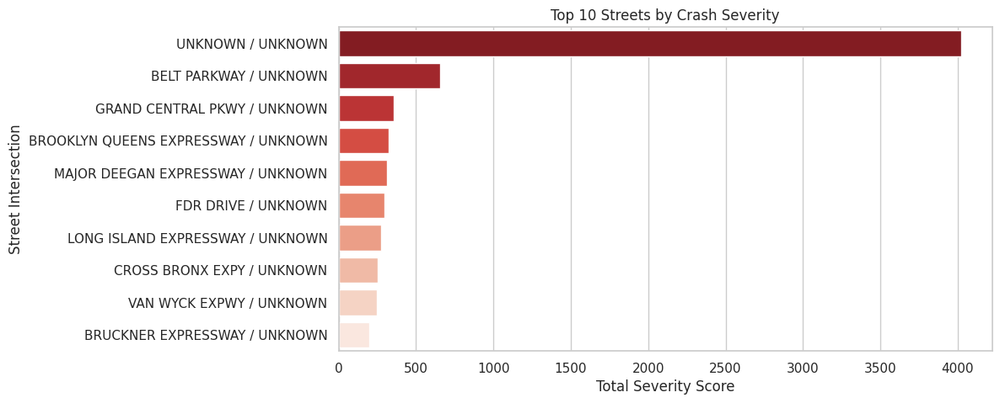

In [39]:
# Combine on-street and cross-street names into a single identifier for intersection
df['STREET_COMBO'] = df['ON_STREET_NAME'] + ' / ' + df['CROSS_STREET_NAME']
street_severity = df.groupby('STREET_COMBO')['SEVERITY_SCORE'].sum().sort_values(ascending=False).head(10)

# Visualization: Top 10 intersections by total severity
plt.figure(figsize=(10,5))
sns.barplot(x=street_severity.values, y=street_severity.index, palette='Reds_r')
plt.title('Top 10 Streets by Crash Severity')
plt.xlabel('Total Severity Score')
plt.ylabel('Street Intersection')
plt.show()



In [23]:
# Create map centered on NYC
map_nyc = folium.Map(location=[40.7128, -74.0060], zoom_start=11)

# Add severe crash points (SEVERITY_SCORE > 0)
for idx, row in df[df['SEVERITY_SCORE']>0].iterrows():
    folium.CircleMarker(
        location=[row['LATITUDE'], row['LONGITUDE']],
        radius=2,
        color='red',
        fill=True,
        fill_opacity=0.5
    ).add_to(map_nyc)

# Display map
map_nyc
